[Источник](https://courses.cs.ut.ee/MTAT.03.227/2015_spring/uploads/Main/home-exercises-5.pdf)

# Одномерная деревня

##### Выполнил: Агафонов Артём

##### Баллов:   /50

Далее речь пойдет о полностью вымышленном мире, в котором возможны одномерные деревни и прочие привратности судьбы.
Пусть у нас есть одномерная деревня, в которой $N$ домов располагаются на отрезке от $0$ до $l$ км.

In [2]:
%matplotlib inline
import math
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
import matplotlib as mpl
import seaborn as sns
sns.set()

/Users/artemavdeev/anaconda/envs/py3/lib/python3.6/site-packages/matplotlib/__init__.py:1003: UserWarning: Duplicate key in file "/Users/artemavdeev/.matplotlib/matplotlibrc", line #2
  (fname, cnt))


Для Вашего удобства ниже написана функция, которая рисует небольшую одномерную деревню.

In [446]:
def plot_village(coordinates, l=1):
    # Checking, that all the coordinates are less than l
    assert (coordinates <= l).all(), 'All the houses should be in a village'
    
    # Draw horizontal line
    plt.hlines(0, 0, l)
    plt.xlim(0, l)
    plt.ylim(-0.5, 0.5)
    
    # Draw house points
    y = np.zeros(np.shape(coordinates))
    plt.title('The Hobbit Village')
    plt.plot(coordinates,y,'o',ms = 10)
    plt.axis('off')
    plt.xlabel('Coordinates')
    fig = plt.gcf()
    fig.set_size_inches(15, 1)
    plt.show()

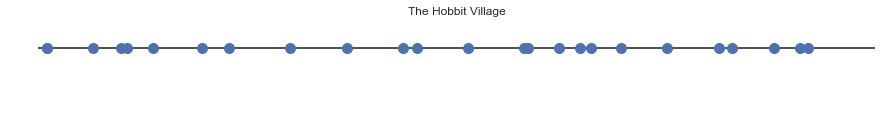

In [447]:
N = 25
l = 1
x = np.random.rand(N)*l
    
plot_village(x, l)

Жители одномерной деревни хотят подключиться к интернету, для этого им необходимо поставить центральную обслуживающую станцию, от которой кабель будет тянуться ко всем домам деревни. Пусть цена кабеля, который надо тянуть от станции до каждого дома независимо, определяется некоторой функцией $p(d)$. Тогда ясно, что деревне придется заплатить следующую сумму за доступ в мировую паутину:
$$
P(w, x) = \sum\limits_{i=1}^N p(d_i) = \sum\limits_{i=1}^N p(|w - x_i|)
$$
Здесь $w$ - координата станции, $x_i$ - координата i-ого домика.

## Задача 1 (1)
Найдите аналитически оптимальную позицию $w^*$, доставляющую минимум функции $P(w, x)$ при условии, что $p(d) = d^2$

$P(w,x) = \sum \limits_{i=1}^N(w-x_i)^2 \Rightarrow \dfrac{\partial P}{\partial x} = - \sum \limits_{i=1}^N 2(w-x_i) \Rightarrow - \sum \limits_{i=1}^N 2(w^* - x_i) = 0 \Rightarrow w^* = \dfrac 1N \sum \limits_{i=1}^N x_i$.
$\dfrac{\partial P}{\partial w} = \sum \limits_{i=1}^N 2(w-x_i) \Rightarrow \sum \limits_{i=1}^N 2(w^*-x_i) = 0 \Rightarrow w^* = \dfrac 1N \sum \limits_{i=1}^N x_i$.
Ответ: $$w^* = \dfrac 1N \sum \limits_{i=1}^N x_i$$

## Задача 2 (2)
Напишите функцию `P`, которая берет на вход позицию станции $w$ и вектор координат $x$ и возвращает значение функции потерь $P$.

In [448]:
def P(w, x):
    return np.linalg.norm(w - x)**2

Постройте значение функции потерь для значения координат от $0$ до $l$.

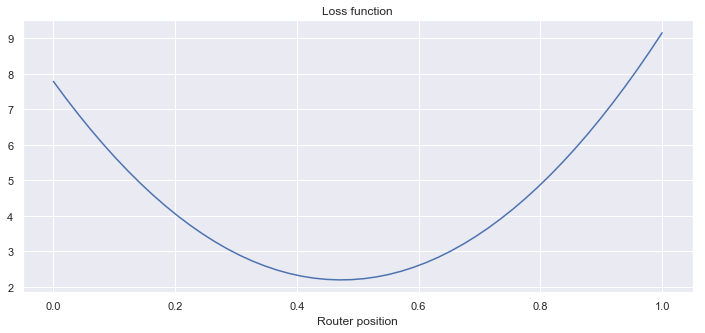

In [449]:
w = np.linspace(0,l)
p = [P(w_i, x) for w_i in w]
plt.title('Loss function')
plt.xlabel('Router position')
plt.plot(w,p)
fig = plt.gcf()
fig.set_size_inches(12, 5)

## Задача 3 (2)
Напишите функцию `dP`, которая берет на вход позицию станции $w$ и вектор координат $x$ и возвращает значение градиента функции потерь $\nabla P$ как функции от $w$.

In [450]:
def dP(w, x):
    return  2*len(x) * w - 2 * np.sum(x)

Постройте значение функции `dP` для значения координат от $0$ до $l$. Какая точка на графике представляет особый интерес? Почему?

Точка, где градиент равен $0$. Потому что функция выпукла и в этой точке достигается минимум.

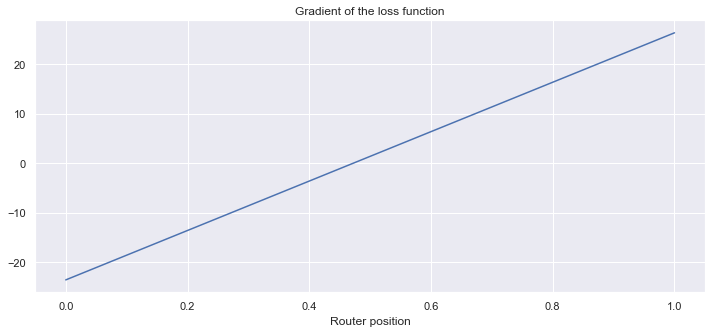

In [451]:
w = np.linspace(0, l)
dp = [dP(w_i, x) for w_i in w]
plt.title('Gradient of the loss function')
plt.xlabel('Router position')
plt.plot(w, dp)
fig = plt.gcf()
fig.set_size_inches(12, 5)

## Задача 4 (2)
Напишите функцию `gradient_descent`, которая возвращает значение $w_k$ через фиксированное число шагов. Длина функции не должна превышать 5 строчек кода.

$$
w_{k+1} = w_k - \mu \nabla P(w_k)
$$

In [452]:
def gradient_descent(x, dP, w0, mu, Nsteps):
    w = w0
    for i in range(Nsteps):
        w = w - mu * dP(w, x)
    return w

## Задача 5 (2)
Модифицируйте функцию `gradient_descent` так, чтобы она возвращала всю траекторию оптимизации (все значения $w_k$). Постройте графики $P(w_k ,x)$ для $\mu = 0.01, 0.1, 0.15, 0.19, 0.20, 0.21$ . Сделайте выводы.

In [453]:
def gradient_descent(x, dP, w0, mu, Nsteps):
    trajectory = [w0]
    for i in range(Nsteps):
         trajectory.append(trajectory[-1] - mu * dP(trajectory[-1], x))
    return trajectory

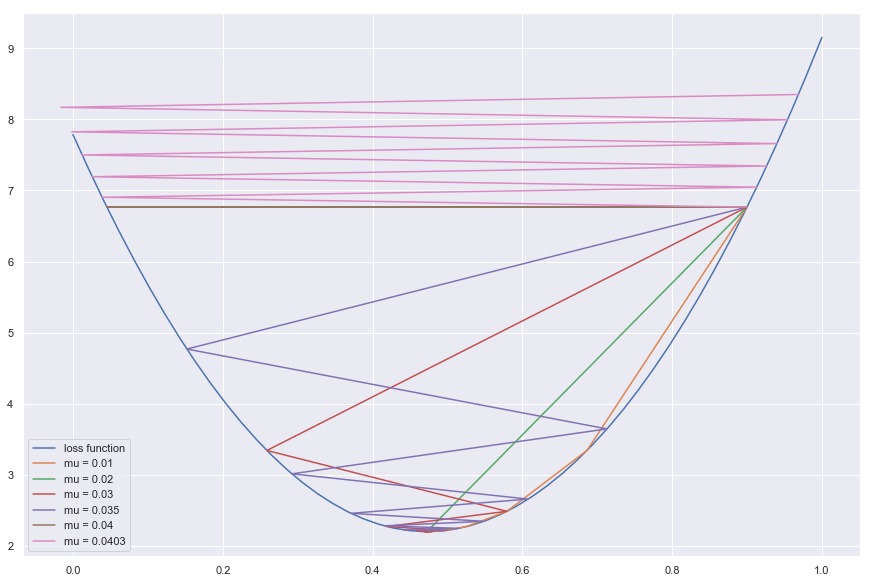

In [454]:
w0 = 0.9 * l
Nsteps = 10


plt.figure(figsize = (15,10))
w = np.linspace(0, l)
p = [P(w_k, x) for w_k in w]
plt.plot(w, p, label = 'loss function')
for mu in [0.01, 0.02, 0.03, 0.035, 0.04, 0.0403]:
    trajectory = gradient_descent(x, dP, w0, mu, Nsteps)
    p = [P(w_k, x) for w_k in trajectory]
    plt.plot(trajectory, p, label = 'mu = {}'.format(mu))
    p = []
plt.legend()
    


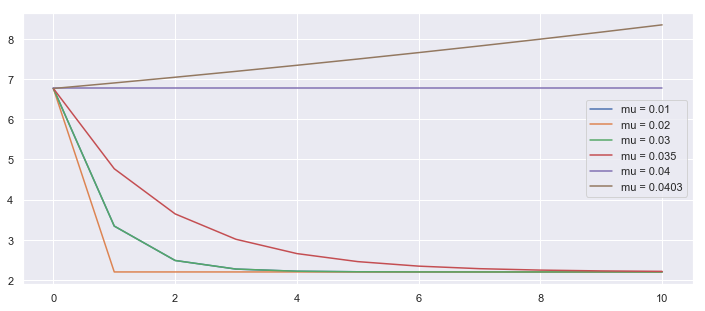

In [455]:
w0 = 0.9 * l
Nsteps = 13


plt.figure(figsize = (15,10))
w = np.linspace(0, l)
for mu in [0.01, 0.02, 0.03, 0.035, 0.04, 0.0403]:
    list_gr = gradient_descent(x, dP, w0, mu, 10)
    P_gr =[P(w_, x) for w_ in list_gr]
    plt.plot(P_gr, label='mu = {}'.format(mu))
#plt.title('Stochastic vs Vanilla RKN Gradient Descent')
plt.legend()
fig = plt.gcf()
fig = plt.gcf()
fig.set_size_inches(12, 5)
plt.legend()

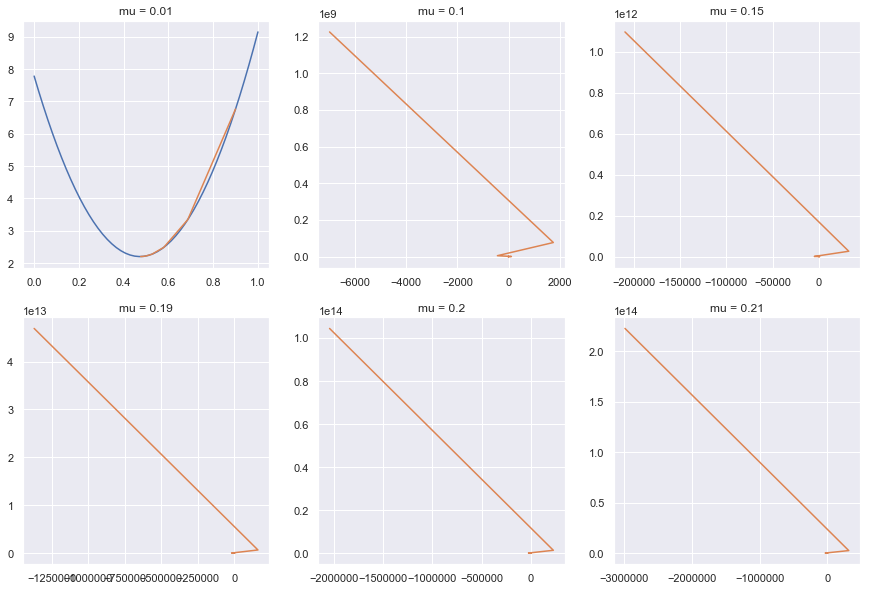

In [456]:
fig = plt.figure(figsize=(15, 10))

Nsteps = 7
w = np.linspace(0, l)
p = [P(w_k, x) for w_k in w]
i = 1
for mu in [0.01, 0.1, 0.15, 0.19, 0.20, 0.21]:
    ax = fig.add_subplot(2, 3, i)
    ax.plot(w, p)
    trajectory = gradient_descent(x, dP, w0, mu, Nsteps)
    p_traj = [P(w_k, x) for w_k in trajectory]
    ax.plot(trajectory, p_traj)
    ax.set_title('mu = {}'.format(mu))
    p_traj = []
    i = i + 1


## Задача 6 (2)
Напишите функцию `ddP`, которая берет на вход позицию станции $w$ и вектор координат $x$ и возвращает значение гессиана функции потерь $\nabla^2 P$ как функции от $w$.

In [457]:
def ddP(w, x):
    return 2 * len(x)

Постройте значение функции `ddP` для значения координат от $0$ до $l$.

Text(0.5, 0, 'w')

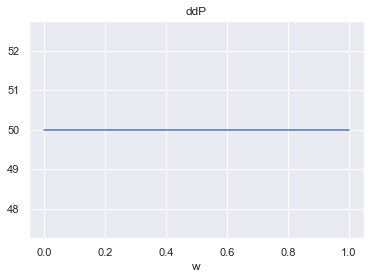

In [458]:
w = np.linspace(0, l)
ddp = [ddP(w_k, x) for w_k in w]
plt.plot(w, ddp)
plt.title('ddP')
plt.xlabel('w')

## Задача 7 (3)
Напишите функцию `newton_descent`, которая возвращает всю оптимизационную траекторию $(w_k)$ через фиксированное число шагов.

In [459]:
def newton_descent(x, dP, ddP, w0, Nsteps):
    trajectory = [w0]
    for i in range(Nsteps):
        trajectory.append(trajectory[-1] - dP(trajectory[-1],x) * (ddP(trajectory[-1], x) ** (-1)))
    return trajectory

Сравните траекторию метода с траекторией градиентного спуска. Исследуйте поведение метода Ньютона в зависимости от разной стартовой точки $w_0$.

Метод Ньютона сходится за одну итерацию (т.к. это парабола). Нет особого смысла сравнивать c траекторией градиентного спуска.

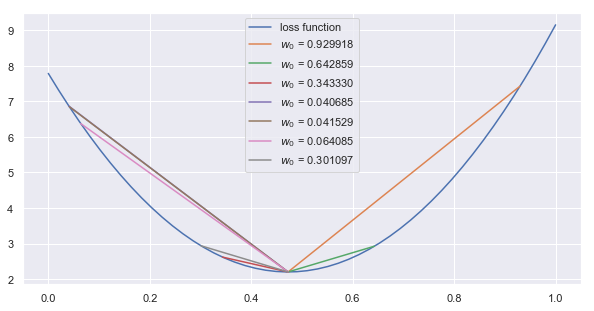

In [460]:
W0 = np.random.random_sample(7) 
Nsteps = 10


plt.figure(figsize = (10,5))
w = np.linspace(0, l)
p = [P(w_k, x) for w_k in w]
plt.plot(w, p, label = 'loss function')
for w0 in W0:
    trajectory = newton_descent(x, dP, ddP, w0, Nsteps)
    p = [P(w_k, x) for w_k in trajectory]
    plt.plot(trajectory, p, label = '$w_0$ = {}'.format(str(w0)[:8]))
    p = []
plt.legend()
    

Давайте нарисуем оптимальное положение роутера в деревне хоббитцов:

In [461]:
def plot_village_with_internet(coordinates, router_coordinates, l=1):
    # Checking, that all the coordinates are less than l
    assert (np.array(coordinates) <= l).all(), 'All the houses should be in the village'
    assert (np.array(router_coordinates) <= l).all(), 'Router should be in the village'
    
    # Draw horizontal line
    plt.hlines(0, 0, l)
    plt.xlim(0, l)
    plt.ylim(-0.5, 0.5)
    
    # Draw house points
    y = np.zeros(np.shape(coordinates))
    plt.title('Modern Hobbit Village')
    plt.plot(coordinates,y,'o',ms = 10)  
    
    # Draw routers
    y = np.zeros(np.shape(router_coordinates))
    plt.plot(router_coordinates,y,'*',ms = 50)
    plt.axis('off')
    plt.xlabel('Coordinates')
    fig = plt.gcf()
    fig.set_size_inches(15, 1)
    plt.show()

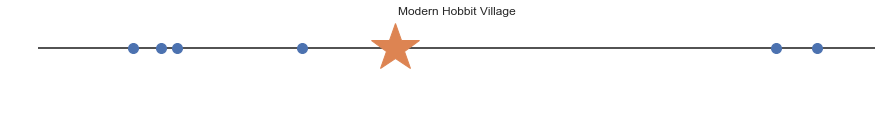

In [462]:
N = 6
l = 1
x = np.random.rand(N)*l

w_ = newton_descent(x, dP, ddP, 0, 2)[-1]
    
plot_village_with_internet(x, w_, l)

## Задача 8 (3)
Напишите функцию `stochastic_gradient_descent`, которая возвращает всю оптимизационную траекторию $(w_k)$ через фиксированное число шагов по методу стохастического градиентного спуска (градиент считается не по всем домикам деревни хоббитцов, а по случайному подмножеству)

In [463]:
# Stochastic Gradient
def dP_sigma(w, x, p=0.5):
    random_mask = np.random.binomial(1, p, x.shape)
    return 2 * np.sum(random_mask * (w - x))


def stochastic_gradient_descent(x, dP_sigma, w0, mu, Nsteps):
    trajectory = [w0]
    for i in range(Nsteps):
         trajectory.append(trajectory[-1] - mu * dP_sigma(trajectory[-1], x))
    return trajectory

Увеличьте число домиков до $50$, сравните траектории алгоритмов градиентного и стохастического градиентного спуска. Сравните их.

Hint: придется изменить размер шага, чтобы работало:)

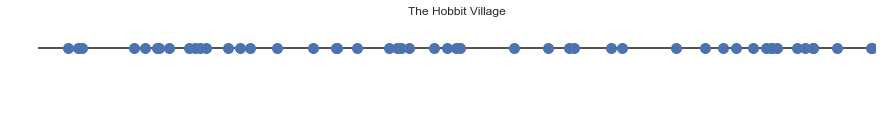

In [466]:
N = 50
l = 1
x = np.random.rand(N)*l
    
plot_village(x, l)

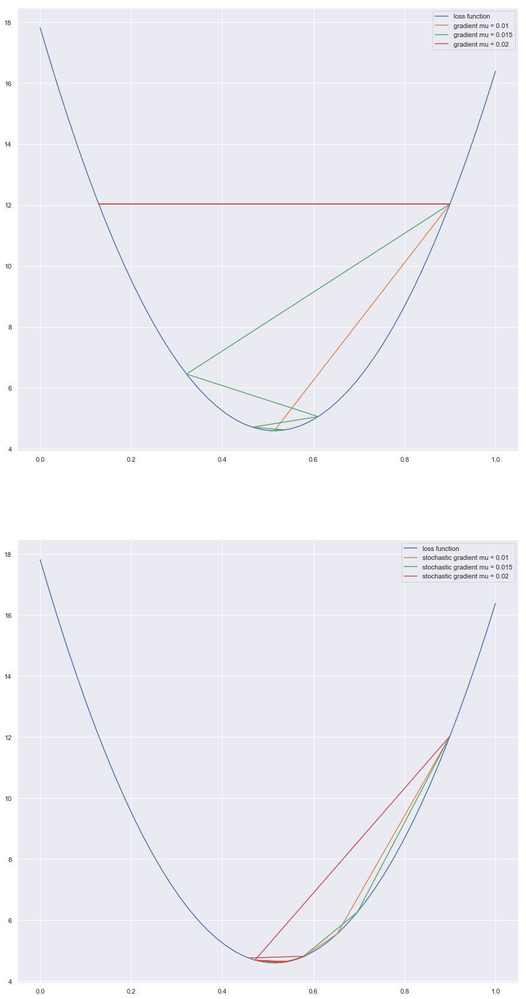

In [470]:
Nsteps = 10

fig = plt.figure(figsize = (15,30))
ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)
w0 = 0.9
w = np.linspace(0, l)
p = [P(w_k, x) for w_k in w]
ax1.plot(w, p, label = 'loss function')
ax2.plot(w, p, label = 'loss function')
for mu in [0.01, 0.015, 0.02]:
    trajectory = gradient_descent(x, dP, w0, mu, Nsteps)
    p = [P(w_k, x) for w_k in trajectory]
    ax1.plot(trajectory, p, label = 'gradient mu = {}'.format(mu))
    stochastic_trajectory = stochastic_gradient_descent(x, dP_sigma, w0, mu, Nsteps)
    p = [P(w_k, x) for w_k in stochastic_trajectory]
    ax2.plot(stochastic_trajectory, p, label = 'stochastic gradient mu = {}'.format(mu))
    p = []
ax1.legend()
ax2.legend()

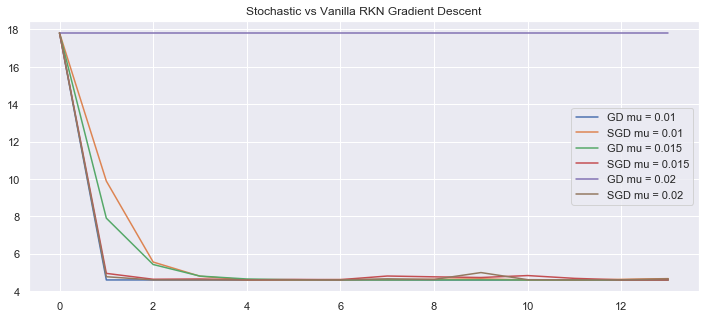

In [472]:
w0 = 0.9 * l
Nsteps = 13


plt.figure(figsize = (15,10))
w = np.linspace(0, l)
for mu in [0.01, 0.015, 0.02]:
    list_gr = gradient_descent(x, dP, 0, mu, Nsteps)
    P_gr =[P(w_, x) for w_ in list_gr]
    plt.plot(P_gr, label='GD mu = {}'.format(mu))
    list_sgd = stochastic_gradient_descent(x, dP_sigma, 0, mu, Nsteps)
    P_sgd =[P(w_, x) for w_ in list_sgd]
    plt.plot(P_sgd, label='SGD mu = {}'.format(mu))
plt.title('Stochastic vs Vanilla RKN Gradient Descent')



plt.legend()
fig = plt.gcf()
fig = plt.gcf()
fig.set_size_inches(12, 5)

Только-только жизнь обитателей одномерной деревни наладилась, как роскомнадзор (казалось бы, какое ему дело) сказал, что цена на кабель должна считаться совсем по другой формуле: 
$$
p(d) = |d|
$$

## Задача 9 (3)
Напишите функции `P`, `dP`, `ddP` в новых реалиях. Постройте их для заданного $x$ при различных $w$.

In [473]:
def P(w, x):
    return np.linalg.norm(w - x, ord = 1)

def dP(w, x):
    return np.sum(np.sign(w - x))

def ddP(w, x):
    if w in x:
        ddP = math.inf
    else:
        ddP = 0
    return ddP

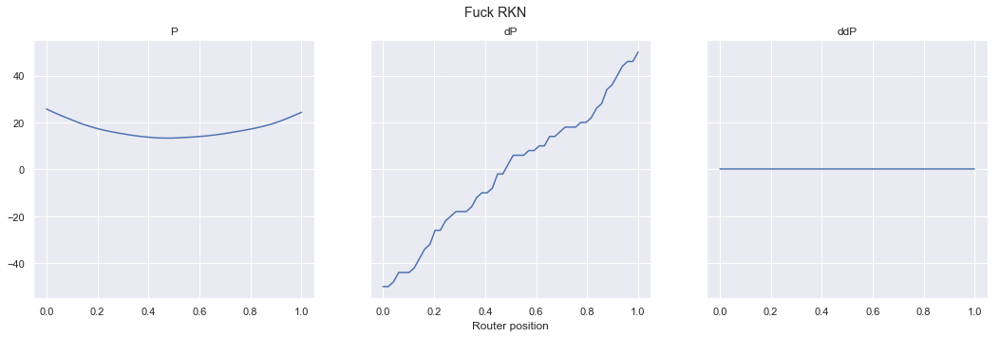

In [474]:
w = np.linspace(0,l)

p = [P(w_i, x) for w_i in w]
dp = [dP(w_i, x) for w_i in w]
ddp = [ddP(w_i, x) for w_i in w]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
ax1.plot(w,p)
ax1.set_title('P')
ax2.plot(w,dp)
ax2.set_title('dP')
ax3.plot(w,ddp)
ax3.set_title('ddP')
ax2.set_xlabel('Router position')
f.set_size_inches(18, 5)
f.suptitle('Fuck RKN')
plt.show()

Найдите оптимальное значение $w^*$ в новых реалиях.

$$ \frac{\partial P}{\partial w} = \sum \limits_{i=1}^{N} sign(w - x_i) = 0.$$

Таким образом, если $N$ нечетно, то $w^*$ -- такой x_i, что левее и правее него одинаковое число $x_j, j \neq i$. 
Если $N$ четно, то можем взять любой $x \in (x_i, x_{i+1})$, где $x_i, x_{i+1}$ средние элементы.


## Задача 10 (2)
Постройте траекторию градиентного спуска в новых реалиях. Что Вы скажете роскомнадзору, когда он потребует решать эту задачу методом Ньютона (потому что они где то слышали, что надо использовать лучшие мировые практики)?

Ньютон не сработает, т.к. гессиан $0$ почти во всех точках.

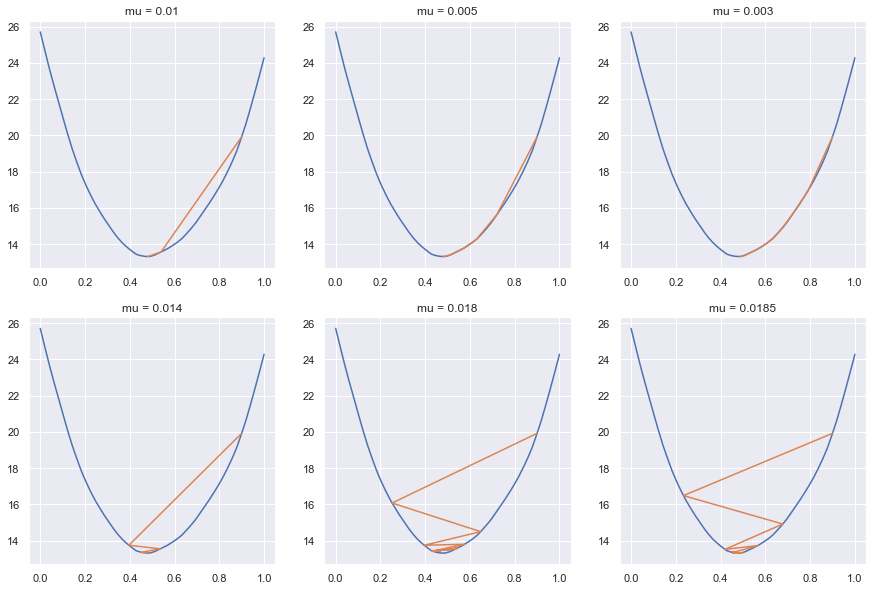

In [475]:
fig = plt.figure(figsize=(15, 10))

Nsteps = 50
w = np.linspace(0, l)
p = [P(w_k, x) for w_k in w]
i = 1
for mu in [0.01, 0.005, 0.003, 0.014, 0.018, 0.0185]:
    ax = fig.add_subplot(2, 3, i)
    ax.plot(w, p)
    trajectory = gradient_descent(x, dP, w0, mu, Nsteps)
    p_traj = [P(w_k, x) for w_k in trajectory]
    ax.plot(trajectory, p_traj)
    ax.set_title('mu = {}'.format(mu))
    p_traj = []
    i = i + 1

## Задача 11 (3)
Реализуйте функции `dP_sigma`, `stochastic_gradient_descent` в новых реалиях.

In [480]:
def dP_sigma(w, x, p):
    random_mask = np.random.binomial(1, p, x.shape)
    return np.sum(random_mask * np.sign(w - x))

def stochastic_gradient_descent(P, dP_sigma, w0, mu, Nsteps, p):
    trajectory = [w0]
    for i in range(Nsteps):
         trajectory.append(trajectory[-1] - mu * dP_sigma(trajectory[-1], x, p))
    return trajectory

Постройте траектории градиентного и стохастического градиентного спуска. Поэксперементируйте с уровнем шума в стох. градиенте путем изменения доли домиков, по которым считается градиент ($p$). Проведите эксперименты для большого числа домиков (от $10000$) и сравните результаты.

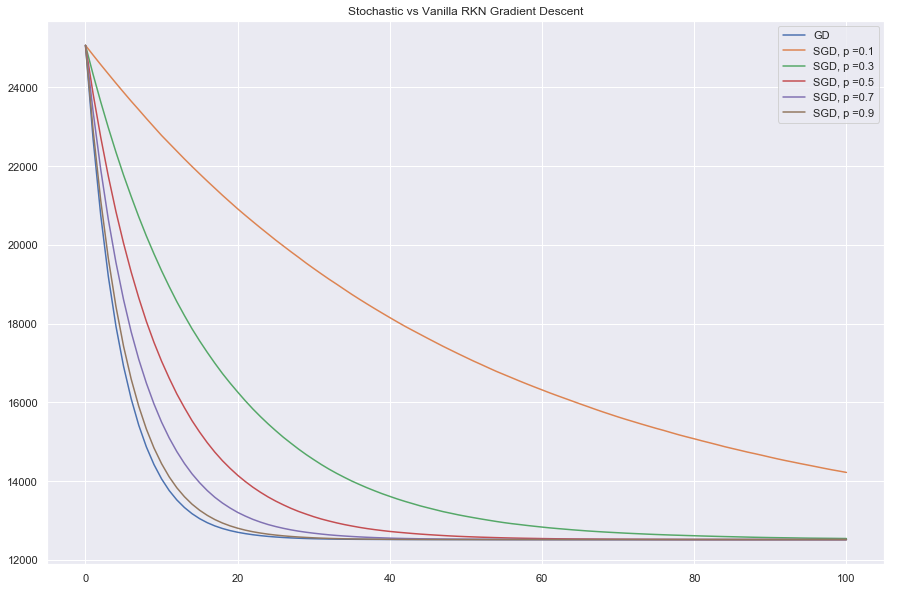

In [488]:
N = 50000
l = 1
x = np.random.rand(N)*l
mu = 0.000001

list_gr = gradient_descent(x, dP, 0, mu, 100)
P_gr =[P(w_, x) for w_ in list_gr]
plt.plot(P_gr, label='GD')


for p in np.arange(0.1, 1.0, 0.2):
    list_sgd = stochastic_gradient_descent(x, dP_sigma, 0, mu, 100, p)
    P_sgd =[P(w_, x) for w_ in list_sgd]
    plt.plot(P_sgd, label='SGD, p ={}'.format(str(p)[:3]))
    P_sgd = []

plt.title('Stochastic vs Vanilla RKN Gradient Descent')
plt.legend()
fig = plt.gcf()
fig = plt.gcf()
fig.set_size_inches(15, 10)

Дела шли своим чередом в деревне хоббитцов. Однако, как и всякое процветающее общество (коим без всяких сомнений себя считали хоббитцы), они решили, что их количество увеличилось достаточно для того, чтобы поставить второй датацетр (роутер) и проводить интернет к каждому дому от ближайшего к нему роутера.
$$
P(w_1, w_2, x) = \sum\limits_{i=1}^N p(d_i) = \sum\limits_{i=1}^N p\left(\min\left(\left|w_1 - x_i\right|, \left|w_2 - x_i\right|\right)\right)
$$

## Задача 12 (2)
Напишите функции `P`, `dP` в новых реалиях. Постройте их для заданного $x$ при различных $w_1, w_2$. Помните, что градиент в этом случае представляет собой двумерный вектор.

In [4]:
def P(w1, w2, x):
    x = np.array(x)
    return sum(np.amin([np.abs(w1 - x),np.abs(w2 - x)], axis=0))

def dP(w1, w2, x):
    grad = [0, 0]
    for x_k in x:
        a = np.abs(w1 - x_k)
        b = np.abs(w2 - x_k) 
        if a < b:
            if w1 > x_k:
                grad[0] = grad[0] + 1.
            elif w1 < x_k:
                grad[0] = grad[0] - 1.
        else:
            if w2 > x_k:
                grad[1] = grad[1] + 1.
            elif w2 < x_k:
                grad[1] = grad[1] - 1.
    return np.array(grad)

Постройте графики $P(w_1, w_2), \nabla P(w_1, w_2)$ для различных значений $N$. Прокомментируйте, что происходит по мере увеличения $N$.

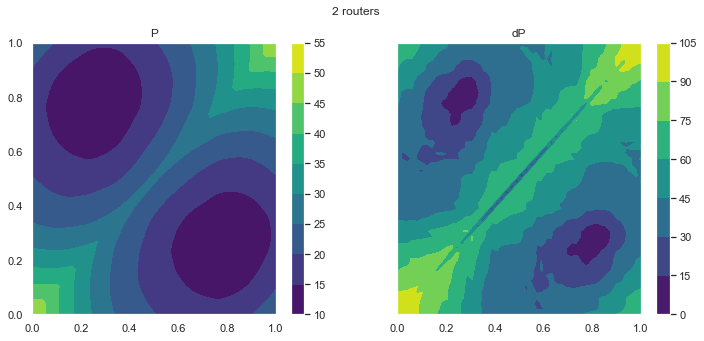

In [114]:
N = 100
l = 1
x = np.random.rand(N)*l

w1 = np.linspace(0,l)
w2 = np.linspace(0,l)

p = np.zeros([w1.shape[0], w1.shape[0]])
dp = np.zeros([w1.shape[0], w1.shape[0]])

i = 0
for w1_ in w1:
    j = 0
    for w2_ in w2:
        p[i][j]  =  P(w1_, w2_, x)
        dp[i][j] = np.linalg.norm(dP(w1_, w2_, x))
        j += 1
    i += 1

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
c1 = ax1.contourf(w1, w2, p, cmap="viridis")
plt.colorbar(c1, ax = ax1)
ax1.set_title('P')
c2 = ax2.contourf(w1, w2, dp, cmap="viridis")
plt.colorbar(c2, ax = ax2)
ax2.set_title('dP')

f.set_size_inches(12, 5)
f.suptitle('2 routers')
plt.show()

## Задача 13 (4)
Напишите функцию `gradient_descent`, которая возвращает всю оптимизационную траекторию $(w_k)$ через фиксированное число шагов и рисует процесс на графиках $P$ и $\nabla P$, что были выше (анимацию).

Пользовался [балдёжным туториалом](https://jed-ai.github.io/py1_gd_animation/).

In [6]:
def gradient_descent(x, dP_sigma, w0, mu, Nsteps):
    w0_0, w0_1 = w0
    trajectory = [[w0_0],[w0_1]]
    for i in range(Nsteps):
        trajectory[0].append(trajectory[0][-1] - mu * dP(trajectory[0][-1], trajectory[1][-1], x)[0])
        trajectory[1].append(trajectory[1][-1] - mu * dP(trajectory[0][-1], trajectory[1][-1], x)[1]) 
        
    
    
    ''' Animation '''
    # Create animation
    line, = ax1.plot([], [], 'r', label = 'Gradient descent', lw = 1.5)
    point, = ax1.plot([], [], 'wo')
    value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

    line1, = ax2.plot([], [], 'r', label = 'Gradient descent', lw = 1.5)
    point1, = ax2.plot([], [], 'wo')
    value_display1 = ax2.text(0.02, 0.02, '', transform=ax2.transAxes)

    def init():
        line.set_data([], [])
        point.set_data([], [])
        value_display.set_text('')

        line1.set_data([], [])
        point1.set_data([], [])
        value_display1.set_text('')
        return line, line1, point, point1, value_display, value_display1

    def animate(i):
    # Animate line
        line.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
        line1.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
    # Animate points
        point.set_data(trajectory[0][i], 
                       trajectory[1][i])
        point1.set_data(trajectory[0][i], 
                       trajectory[1][i])

    # Animate value display
        value_display.set_text('Min f= ' + str(P(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
        value_display1.set_text('Min grad= ' + str(dP(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
    

        return line, line1, point,point1, value_display

    ax1.legend(loc = 1)
    ax2.legend(loc = 1)

    anim = animation.FuncAnimation(f, animate, init_func=init,
                               frames=len(trajectory[0]), interval=120, 
                               repeat_delay=60, blit=True)

    plt.show()
    return trajectory, anim

In [7]:
ani = gradient_descent(x, dP, [0.1, 0.2], mu=10**(-3), Nsteps=100)[1]
HTML(ani.to_jshtml())

## Задача 14 (4)
Напишите функцию `stochastic_gradient_descent`, которая возвращает всю оптимизационную траекторию $(w_k)$ метода стохастического градиентного спуска через фиксированное число шагов и рисует процесс на графиках $P$ и $\nabla P$, что были выше (анимацию).

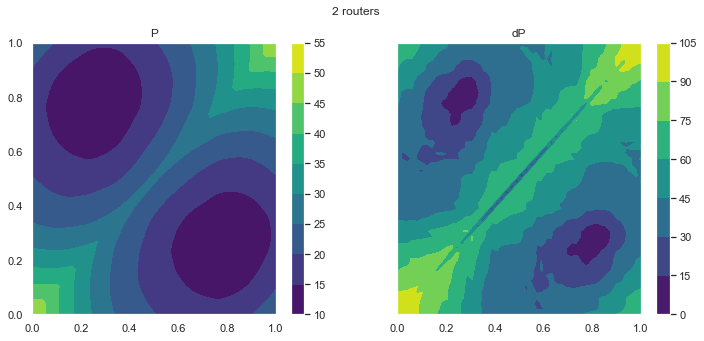

In [119]:
w1 = np.linspace(0,l)
w2 = np.linspace(0,l)

p = np.zeros([w1.shape[0], w1.shape[0]])
dp = np.zeros([w1.shape[0], w1.shape[0]])

i = 0
for w1_ in w1:
    j = 0
    for w2_ in w2:
        p[i][j]  =  P(w1_, w2_, x)
        dp[i][j] = np.linalg.norm(dP(w1_, w2_, x))
        j += 1
    i += 1

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
c1 = ax1.contourf(w1, w2, p, cmap="viridis")
plt.colorbar(c1, ax = ax1)
ax1.set_title('P')
c2 = ax2.contourf(w1, w2, dp, cmap="viridis")
plt.colorbar(c2, ax = ax2)
ax2.set_title('dP')

f.set_size_inches(12, 5)
f.suptitle('2 routers')


def dP_sigma(w1, w2, x):
    grad = [0, 0]
    i = 0
    random_mask = np.random.binomial(1, 0.3, x.shape)
    for x_k in x:
        if random_mask[i] == 1:
            a = np.abs(w1 - x_k)
            b = np.abs(w2 - x_k) 
            if a < b:
                if w1 > x_k:
                    grad[0] = grad[0] + 1.
                elif w1 < x_k:
                    grad[0] = grad[0] - 1.
            else:
                if w2 > x_k:
                    grad[1] = grad[1] + 1.
                elif w2 < x_k:
                    grad[1] = grad[1] - 1.
        i = i + 1
    return np.array(grad)


def stochastic_gradient_descent(x, dP_sigma, w0, mu, Nsteps):
    w0_0, w0_1 = w0
    trajectory = [[w0_0],[w0_1]]
    for i in range(Nsteps):
        trajectory[0].append(trajectory[0][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[0])
        trajectory[1].append(trajectory[1][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[1])
    
        ''' Animation '''
    # Create animation
    line, = ax1.plot([], [], 'r', label = 'stochastic gradient descent', lw = 1.5)
    point, = ax1.plot([], [], 'wo')
    value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

    line1, = ax2.plot([], [], 'r', label = 'stochastic gradient descent', lw = 1.5)
    point1, = ax2.plot([], [], 'wo')
    value_display1 = ax2.text(0.02, 0.02, '', transform=ax2.transAxes)

    def init():
        line.set_data([], [])
        point.set_data([], [])
        value_display.set_text('')

        line1.set_data([], [])
        point1.set_data([], [])
        value_display1.set_text('')
        return line, line1, point, point1, value_display, value_display1

    def animate(i):
    # Animate line
        line.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
        line1.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
    # Animate points
        point.set_data(trajectory[0][i], 
                       trajectory[1][i])
        point1.set_data(trajectory[0][i], 
                       trajectory[1][i])

    # Animate value display
        value_display.set_text('Min f= ' + str(P(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
        value_display1.set_text('Min grad= ' + str(dP_sigma(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
    

        return line, line1, point,point1, value_display, value_display1

    ax1.legend(loc = 1)
    ax2.legend(loc = 1)

    anim = animation.FuncAnimation(f, animate, init_func=init,
                               frames=len(trajectory[0]), interval=120, 
                               repeat_delay=60, blit=True)

    return trajectory, anim

In [120]:
ani = stochastic_gradient_descent(x, dP_sigma, [0.1, 0.2], mu=10**(-3), Nsteps=100)[1]
HTML(ani.to_jshtml())

## Задача 15 (4)
На практике Вам не так часто нужно будет писать свой собстенный алгоритм оптимизации. Решите поставленную выше задачу (2 станции, роскомнадзоровская норма) любым алгоритмом оптимизации из любой библиотеки Python. (cvxpy, scipy и т.д.)
Нарисуйте такие же анимашки.

In [82]:
N = 1000
l = 1
x = np.random.rand(N)*l

trajectory = []
def callback(x):
    trajectory.append(x)
    
from scipy.optimize import minimize

minimize(lambda w: P(w[0], w[1], x), [0.1, 0.2], callback=callback)
trajectory = np.transpose(trajectory)
print(np.array(trajectory))

[[0.04435115 0.1441207  0.42826074 0.27893214 0.19714237 0.2461633
  0.2322115  0.229383   0.22938286]
 [1.20846577 1.25939269 0.68827141 0.8815671  0.7798247  0.74810489
  0.75219375 0.75219624 0.75252099]]


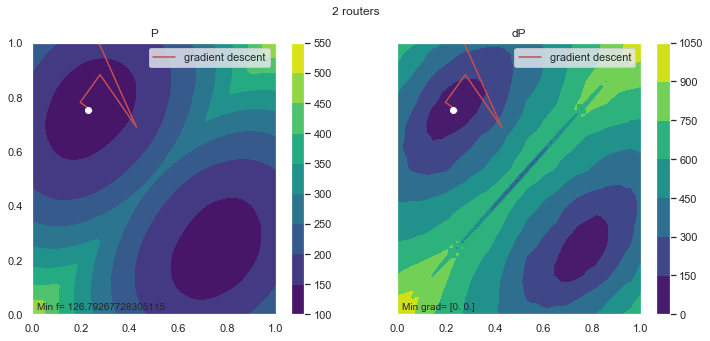

In [87]:
w1 = np.linspace(0,l)
w2 = np.linspace(0,l)

p = np.zeros([w1.shape[0], w1.shape[0]])
dp = np.zeros([w1.shape[0], w1.shape[0]])

i = 0
for w1_ in w1:
    j = 0
    for w2_ in w2:
        p[i][j]  =  P(w1_, w2_, x)
        dp[i][j] = np.linalg.norm(dP(w1_, w2_, x))
        j += 1
    i += 1

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
c1 = ax1.contourf(w1, w2, p, cmap="viridis")
plt.colorbar(c1, ax = ax1)
ax1.set_title('P')
c2 = ax2.contourf(w1, w2, dp, cmap="viridis")
plt.colorbar(c2, ax = ax2)
ax2.set_title('dP')

f.set_size_inches(12, 5)
f.suptitle('2 routers')

# Create animation
line, = ax1.plot([], [], 'r', label = 'gradient descent', lw = 1.5)
point, = ax1.plot([], [], 'wo')
value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

line1, = ax2.plot([], [], 'r', label = 'gradient descent', lw = 1.5)
point1, = ax2.plot([], [], 'wo')
value_display1 = ax2.text(0.02, 0.02, '', transform=ax2.transAxes)

def init():
    line.set_data([], [])
    point.set_data([], [])
    value_display.set_text('')

    line1.set_data([], [])
    point1.set_data([], [])
    value_display1.set_text('')
    return line, line1, point, point1, value_display, value_display1

def animate(i):
    # Animate line
    line.set_data(trajectory[0][:i],
                    trajectory[1][:i])
    
    line1.set_data(trajectory[0][:i],
                    trajectory[1][:i])
    
    # Animate points
    point.set_data(trajectory[0][i], 
                    trajectory[1][i])
    point1.set_data(trajectory[0][i], 
                    trajectory[1][i])

    # Animate value display
    value_display.set_text('Min f= ' + str(P(trajectory[0][i], 
                                            trajectory[1][i], 
                                            x)))
    value_display1.set_text('Min grad= ' + str(dP(trajectory[0][i], 
                                            trajectory[1][i], 
                                            x)))
    

    return line, line1, point,point1, value_display, value_display1

ax1.legend(loc = 1)
ax2.legend(loc = 1)

anim = animation.FuncAnimation(f, animate, init_func=init,
                            frames=len(trajectory[0]), interval=120, 
                            repeat_delay=520, blit=True)
HTML(anim.to_jshtml())

Одномерная деревня научилась решать свои проблемы при любом числе и раположении жителей в мгновение ока. Улучшив качество интернета, хоббитцы смотрели онлайн-курсы и мемесы и жили припеваючи. Как Вы могли догадаться, роскомнадзору это не очень по душе. Вот тут то они выкатили новое требование о том, что дата-центры (роутеры) должны стоять не более, чем на расстоянии половины деревни друг от друга, чтобы силовым структурам было легче собирать информацию о том, как используют интернет жители деревни Одномерново.

$$
\left|w_1 - w_2\right| \leq \dfrac{l}{2}
$$

## Задача 16 (2)
Нарисуйте на плоскости допустимое множество решений. Выпукло ли оно?

Да

Text(0, 0.5, 'w2')

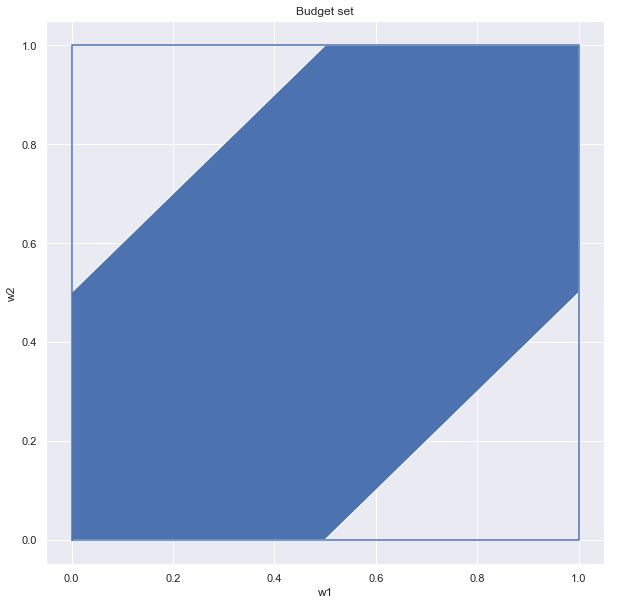

In [162]:
plt.figure(figsize=(10,10))

plt.plot([0, l, l, 0, 0], [0, 0, l, l, 0])
plt.fill([0,0.5*l, l, l, 0.5*l, 0, 0], [0, 0, 0.5*l, l, l, 0.5*l, 0])

plt.title('Budget set')
plt.xlabel('w1')
plt.ylabel('w2')

## Задача 17 (4)
Напишите функцию `conditional_SGD`, которая возвращает всю оптимизационную траекторию $(w_k)$ метода условного стохастического градиентного спуска через фиксированное число шагов и рисует процесс на графиках $P$ и $\nabla P$, что были выше (анимацию).

Метод условного градиентного спуска заключается в том, чтобы делать градиентный шаг, а после этого проверять принадлежность полученной точки целевому множеству. Если она ему принадлежит, то алгоритм продолжается, иначе делается ортогональная проекция на целевое множество.

In [170]:
def conditional_SGD(x, dP_sigma, w0, mu, Nsteps):
    w0_0, w0_1 = w0
    trajectory = [[w0_0], [w0_1]]
    for i in range(Nsteps):
        w0 = (trajectory[0][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[0])
        w1 = (trajectory[1][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[1]) 
        if np.abs(w1 - w0) <= l*1./2 and w1 >= 0 and w0 >= 0 and w1 <= l and w0 <= l:
            trajectory[0].append(w0) 
            trajectory[1].append(w1)
        else:
            if w0 < 0 and w1 <= 0.5*l and w1 >= 0:
                w0 = 0
            elif w1 < 0 and w0 >= 0 and w0 <= 0.5*l:
                w1 = 0
            elif w0 < 0 and w1 < 0:
                w0 = 0
                w1 = 0
            elif w0 > l and w1 > l:
                w0 = l
                w1 = l
            elif w0 > l and w1 >= 0.5*l and w1 <= l:
                w0 = l
            elif w1 > l and w0 >= 0.5*l and w0 <= l:
                w1 = l
            elif (w1 - w0 < - 0.5*l) and (w1 < 0.5*l) and (w0 > 0.5*l):
                if w1 < 0 and w0 < l:
                    w1 = w0 - 0.5*l  
                elif w1 > 0 and w0 > l:
                    w0 = w1 - 0.5*l
                else:
                    a1 = (w0 + w1 + 0.5*l) * 0.5
                    a2 = (w0 + w1 - 0.5*l) * 0.5
                    w0 = a1
                    w1 = a2     
            elif w1 - w0 > 0.5*l and w1 > 0.5*l and w0 < 0.5*l:
                if w1 < l and w0 < 0:
                    w0 =  0.5*l - w1   
                elif w1 > l and w0 > 0:
                    w1 = 0.5*l - w0
                else:
                    a1 = (w0 + w1 - 0.5*l) * 0.5
                    a2 = (w0 + w1 + 0.5*l) * 0.5
                    w0 = a1
                    w1 = a2
            trajectory[0].append(w0)
            trajectory[1].append(w1)
            
    
    # Create animation
    line, = ax1.plot([], [], 'r', label = 'conditional SGD', lw = 1.5)
    point, = ax1.plot([], [], 'wo')
    value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

    line1, = ax2.plot([], [], 'r', label = 'conditional SGD', lw = 1.5)
    point1, = ax2.plot([], [], 'wo')
    value_display1 = ax2.text(0.02, 0.02, '', transform=ax2.transAxes)

    def init():
        line.set_data([], [])
        point.set_data([], [])
        value_display.set_text('')

        line1.set_data([], [])
        point1.set_data([], [])
        value_display1.set_text('')
        return line, line1, point, point1, value_display, value_display1

    def animate(i):
    # Animate line
        line.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
        line1.set_data(trajectory[0][:i],
                      trajectory[1][:i])
    
    # Animate points
        point.set_data(trajectory[0][i], 
                       trajectory[1][i])
        point1.set_data(trajectory[0][i], 
                       trajectory[1][i])

    # Animate value display
        value_display.set_text('Min f= ' + str(P(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
        value_display1.set_text('Min grad= ' + str(dP_sigma(trajectory[0][i], 
                                                trajectory[1][i], 
                                                x)))
    

        return line, line1, point,point1, value_display, value_display1

    ax1.legend(loc = 1)
    ax2.legend(loc = 1)

    anim = animation.FuncAnimation(f, animate, init_func=init,
                               frames=len(trajectory[0]), interval=120, 
                               repeat_delay=60, blit=True)

    return trajectory, anim

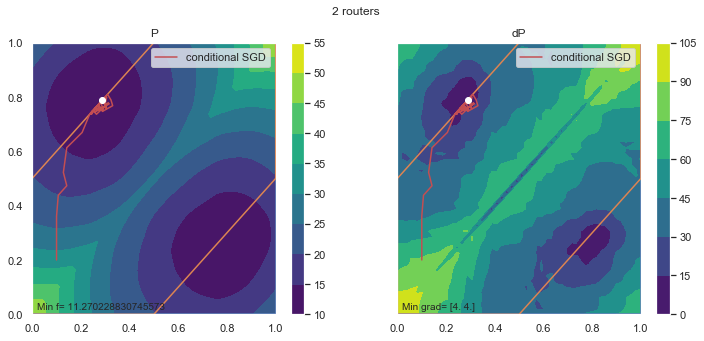

In [171]:
w1 = np.linspace(0,l)
w2 = np.linspace(0,l)

p = np.zeros([w1.shape[0], w1.shape[0]])
dp = np.zeros([w1.shape[0], w1.shape[0]])

i = 0
for w1_ in w1:
    j = 0
    for w2_ in w2:
        p[i][j]  =  P(w1_, w2_, x)
        dp[i][j] = np.linalg.norm(dP(w1_, w2_, x))
        j += 1
    i += 1

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
c1 = ax1.contourf(w1, w2, p, cmap="viridis")
plt.colorbar(c1, ax = ax1)
ax1.set_title('P')
c2 = ax2.contourf(w1, w2, dp, cmap="viridis")
plt.colorbar(c2, ax = ax2)
ax2.set_title('dP')
ax1.plot([0, l, l, 0, 0], [0, 0, l, l, 0])
ax1.plot([0,0.5*l, l, l, 0.5*l, 0, 0], [0, 0, 0.5*l, l, l, 0.5*l, 0])
ax2.plot([0, l, l, 0, 0], [0, 0, l, l, 0])
ax2.plot([0,0.5*l, l, l, 0.5*l, 0, 0], [0, 0, 0.5*l, l, l, 0.5*l, 0])
f.set_size_inches(12, 5)
f.suptitle('2 routers')
ani = conditional_SGD(x, dP_sigma, [0.1, 0.2], mu=0.007, Nsteps=50)[1]
HTML(ani.to_jshtml())

## Задача 18 (5)
Напишите функцию `multi_newton`, которая реализует решение двумерной задачи с $p(d) = d^3$ методом Ньютона и возвращает траекторию работы алгоритма. Сравните результаты для данной задачи с методом стохастического градиентного спуска.

In [249]:
def P(w1, w2, x):
    return np.sum(list(map(lambda x_i: abs(x_i - w1)**3 if abs(x_i - w1) < abs(x_i - w2) else abs(x_i - w2)**3, x)))

def dP(w1, w2, x):
    d1 = np.sum(list(map(lambda y: np.sign(w1 - y) * 3 * (w1 - y)**2  if abs(y - w1) < abs(y - w2) 
                    else (0.5 * np.sign(w1 - x) * 3 * (w1 - y)**2 if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    
    d2 = np.sum(list(map(lambda y: np.sign(w2 - y) * 3 * (w2 - y)**2  if abs(y - w1) > abs(y - w2) 
                    else (0.5 * np.sign(w2 - x) * 3 * (w2 - y)**2 if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    return [d1,d2]

def ddP(w1, w2, x):
    dd1 = np.sum(list(map(lambda y: np.sign(w1 - y) * 6 * (w1 - y)  if abs(y - w1) < abs(y - w2) 
                    else ( np.sign(w1 - x) * 3 * (w1 - y) if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    
    dd2 = np.sum(list(map(lambda y: np.sign(w2 - y) * 6 * (w2 - y)  if abs(y - w1) > abs(y - w2) 
                    else ( np.sign(w2 - x) * 3 * (w2 - y) if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    return np.array([[dd1, 0],[0, dd2]])

def dP_sigma(w1, w2, x):
    random_mask = np.random.binomial(1, 0.3, x.shape)
    
    d1 = np.sum(random_mask * 
                list(map(lambda y: np.sign(w1 - y) * 3 * (w1 - y)**2  if abs(y - w1) < abs(y - w2) 
                    else (0.5 * np.sign(w1 - x) * 3 * (w1 - y)**2 if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    
    d2 = np.sum(random_mask * 
                list(map(lambda y: np.sign(w2 - y) * 3 * (w2 - y)**2  if abs(y - w1) > abs(y - w2) 
                    else (0.5 * np.sign(w2 - x) * 3 * (w2 - y)**2 if abs(y - w1) == abs(y - w2) 
                         else 0),
                    x)))
    return [d1,d2]

In [251]:
def multi_newton(x, dP, ddP, w0, Nsteps):
    w = w0
    trajectory = [[],[]]
    for i in range(Nsteps):
        trajectory[0].append(w[0])
        trajectory[1].append(w[1])
        w -= np.dot(np.linalg.inv(ddP(w[0], w[1],x)), np.array(dP(w[0],w[1],x)))
    trajectory[0].append(w[0])
    trajectory[1].append(w[1])
    return trajectory

def stochastic_gradient_descent(x, dP_sigma, w0, mu, Nsteps):
    w0_0, w0_1 = w0
    trajectory = [[w0_0],[w0_1]]
    for i in range(Nsteps):
        trajectory[0].append(trajectory[0][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[0])
        trajectory[1].append(trajectory[1][-1] - mu * dP_sigma(trajectory[0][-1], trajectory[1][-1], x)[1])
    return trajectory

In [255]:
print(stochastic_gradient_descent(x, dP_sigma, [0.1, 0.2], mu=10**(-2), Nsteps=100)[0][-1])
print(stochastic_gradient_descent(x, dP_sigma, [0.1, 0.2], mu=10**(-2), Nsteps=100)[1][-1])

0.23879854183328594
0.7536073295909863


In [256]:
print(multi_newton(x, dP, ddP, [0.1, 0.2], Nsteps = 100)[0][-1])
print(multi_newton(x, dP, ddP, [0.1, 0.2], Nsteps = 100)[1][-1])

0.23879174230567193
0.7525676805810373


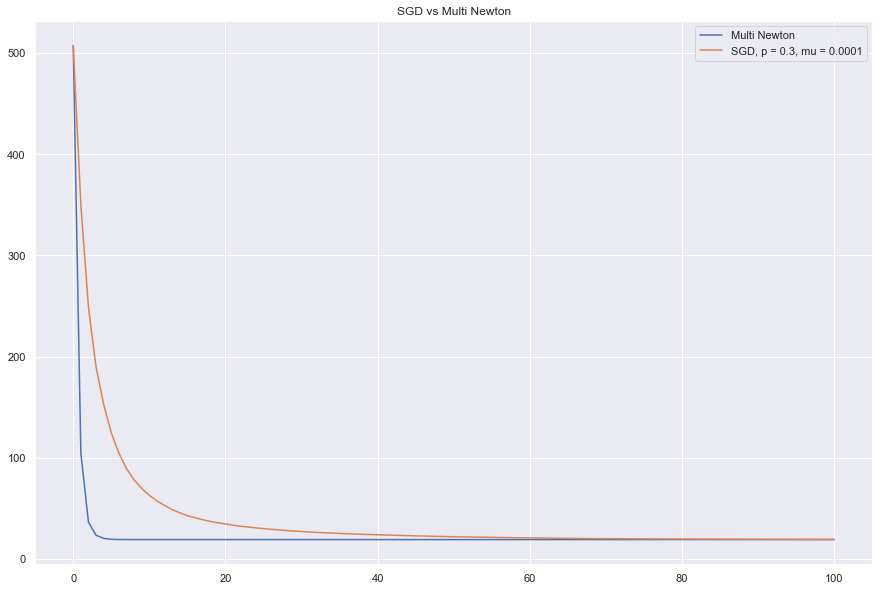

In [267]:
N = 5000
l = 1
x = np.random.rand(N)*l
mu = 0.0001

list_mn = multi_newton(x, dP, ddP, [0.1, 0.2], 100)
P_mn =[P(w_[0], w_[1], x) for w_ in np.transpose(list_mn)]
plt.plot(P_mn, label='Multi Newton')



list_sgd = stochastic_gradient_descent(x, dP_sigma, [0.1, 0.2], mu, 100)
P_sgd =[P(w_[0], w_[1], x) for w_ in np.transpose(list_sgd)]
plt.plot(P_sgd, label='SGD, p = 0.3, mu = 0.0001')
P_sgd = []

plt.title('SGD vs Multi Newton')
plt.legend()
fig = plt.gcf()
fig = plt.gcf()
fig.set_size_inches(15, 10)


In [ ]:
from IPython.core.display import HTML
def css_styling():
    styles = open("custom.css", "r").read() #or edit path to custom.css
    return HTML(styles)
css_styling()